Ultralytics 8.3.101  Python-3.11.3 torch-2.6.0+cpu CPU (Intel Core(TM) i7-4790K 4.00GHz)
Ultralytics 8.3.101  Python-3.11.3 torch-2.6.0+cpu CPU (Intel Core(TM) i7-4790K 4.00GHz)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
YOLOv9m summary (fused): 151 layers, 20,015,884 parameters, 0 gradients, 76.5 GFLOPs
Saved .txt file: ./labels\0002_jpg.rf.1e66a3c788c21cd312d09a6288c36f4d.txt


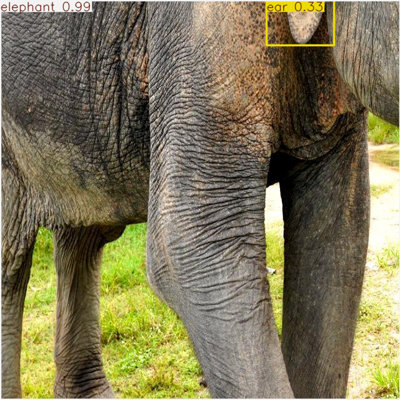

Saved .txt file: ./labels\0002_jpg.rf.78458b7843db7c301675ccf916f021a8.txt


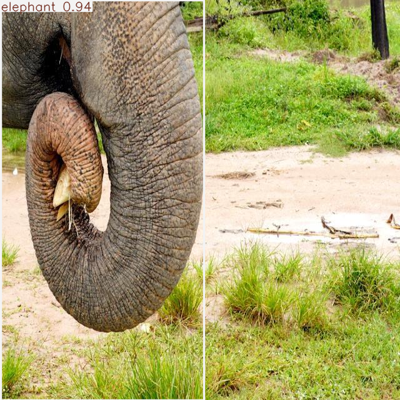

Saved .txt file: ./labels\0004_jpg.rf.f30bfc1ee94725fc9ee7854787c58972.txt


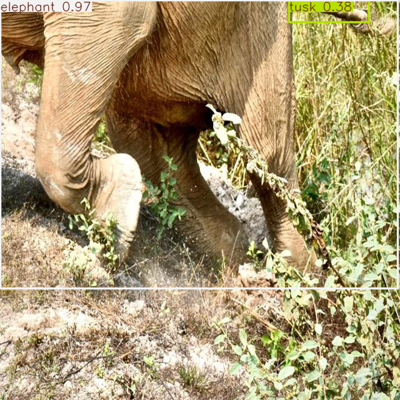

Saved .txt file: ./labels\0007_jpg.rf.1c1050aef4baf5db95f7f19a8ed2789f.txt


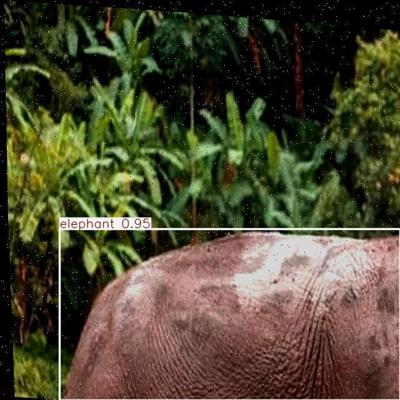

Saved .txt file: ./labels\0007_jpg.rf.8ae01f7487627227948b9299da8e9421.txt


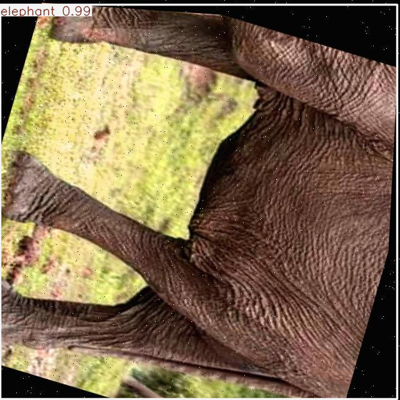

Saved .txt file: ./labels\0007_jpg.rf.33a726676172b496741956cc6e85fad5.txt


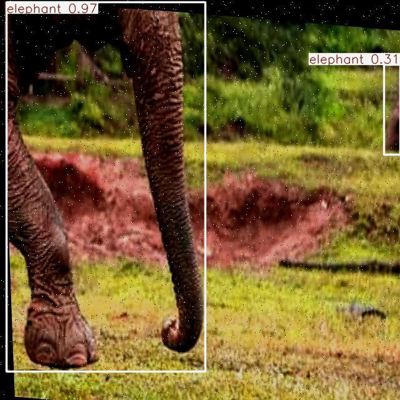

Saved .txt file: ./labels\0008_jpg.rf.f216a1c71a9848e4b58d0a2c97060d85.txt


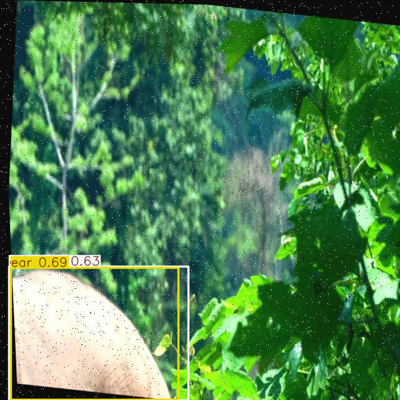

Saved .txt file: ./labels\0009_jpg.rf.336ca91d37be5a758cd8f1d0b94cd4a2.txt


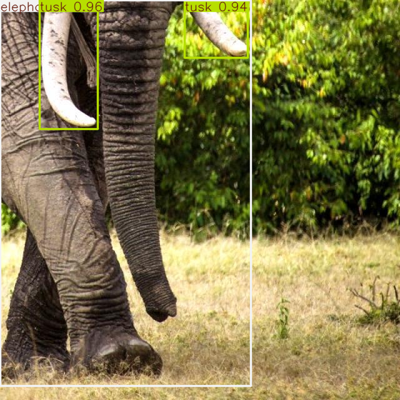

Saved .txt file: ./labels\0009_jpg.rf.c7053c12d7310faf2bc9de3811311edd.txt


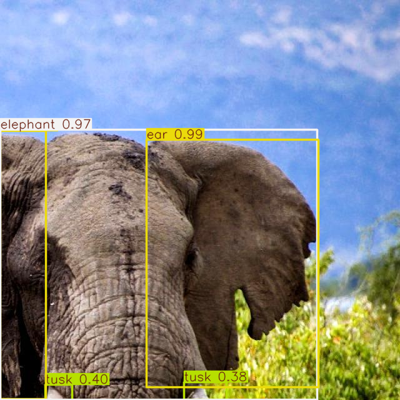

Saved .txt file: ./labels\-calf-in-fenced-enclosure-with-hay-bales-at-walt-disney-world-animal-kingdom_jpg.rf.a46c5ce1e06aebf759df6a494204dd2d.txt


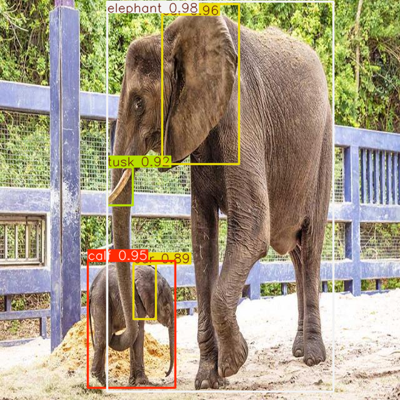

Saved .txt file: ./labels\Dibo_dgor3_IMAG0936_JPG.rf.678f3c92a1a9346f563b73d036ebe1bf.txt


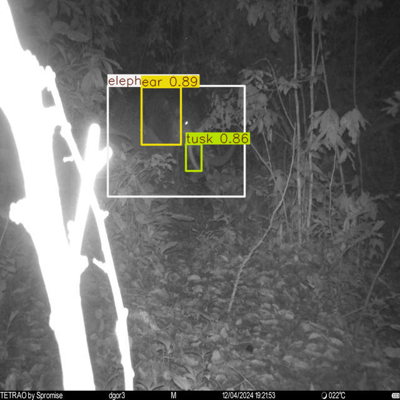

Saved .txt file: ./labels\Dibo_dgor3_IMAG0937_JPG.rf.e2ad7769f692da27066ac5548f36e9a6.txt


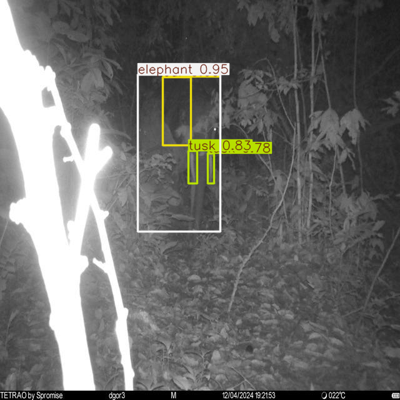

Saved .txt file: ./labels\Dibo_dgor3_IMAG0939_JPG.rf.3031c220ca26c03a60adb21ec4093081.txt


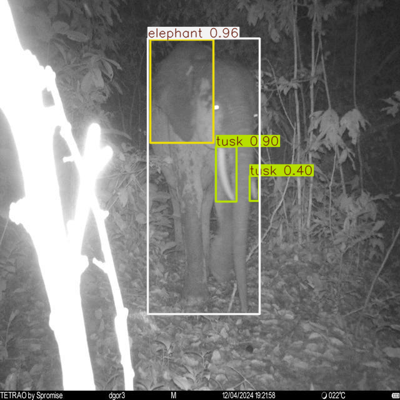

Saved .txt file: ./labels\Dibo_dgor3_IMAG0940_JPG.rf.c96ce9d15b0942dbf8b2d1aadbe1c831.txt


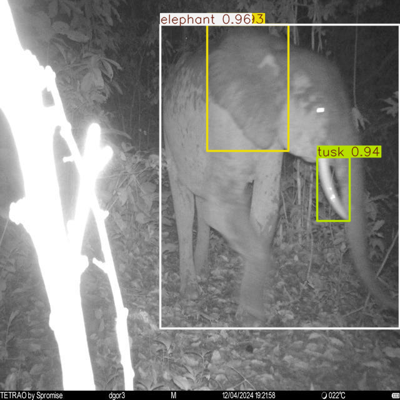

Saved .txt file: ./labels\Dibo_dgor3_IMAG0942_JPG.rf.40c73660dc6a73e1804cc7d41613aa36.txt


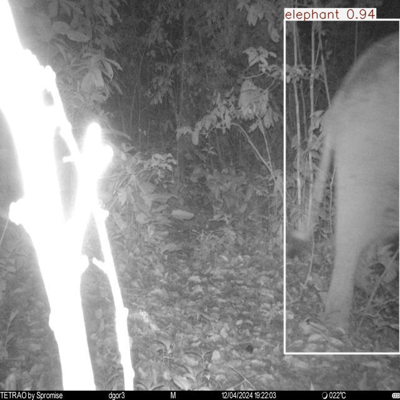

Saved .txt file: ./labels\Golom_gele2_IMAG0274_JPG.rf.a5418dfad3f85e2f1d3e44874dda9cae.txt


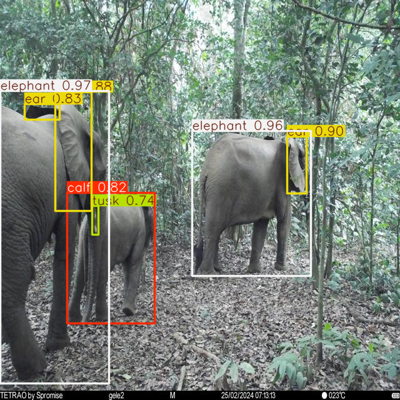

Saved .txt file: ./labels\Golom_gele2_IMAG0315_JPG.rf.93e176c9b46a03c74b2e31239f848cc1.txt


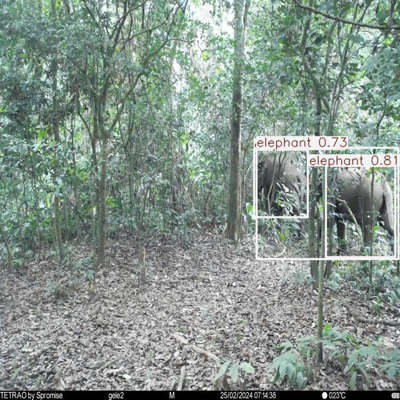

Saved .txt file: ./labels\Golom_gele2_IMAG0845_JPG.rf.38976efdb1ff0a017792c33ca0a9232f.txt


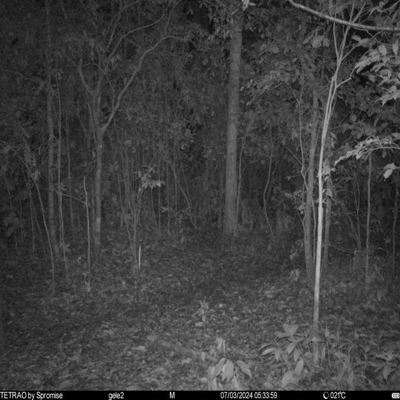

Saved .txt file: ./labels\Golom_gele3_IMAG0459_JPG.rf.3e4cc2bd275a7ef32be38e46d6af9875.txt


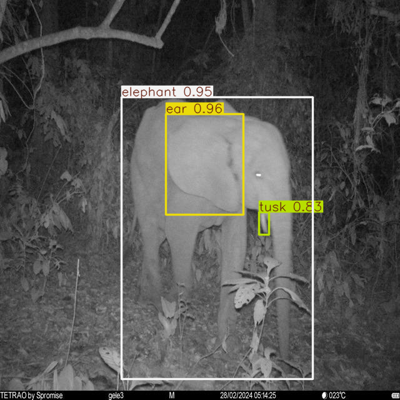

Saved .txt file: ./labels\Golom_gele3_IMAG0896_JPG.rf.70afda99869827b020b3bbe3014298cd.txt


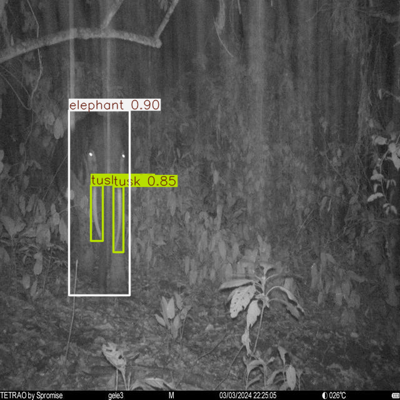

In [1]:
from ct_detector.model.ensemble import CtEnsembler
from ct_detector.model import MODELS, DATASETS, DATASETS_DIR
import os

# 1) Get a dataset
data_path = os.path.join(DATASETS_DIR, "1", "val.txt")  # or your dataset .yaml or folder of images

# 2) Create the ensemble
ensembler = CtEnsembler(
    model_paths=[MODELS['eie_t_1_yolov8m'], MODELS['eie_t_1_yolov9m']], # Specify a list of models
    predictor_overrides={"conf": 0.3, "save_txt": False, "verbose": False},  # e.g. no partial labels
)

# 3) Import callbacks that print data about made predictions and display results
from ct_detector.callbacks.annotate import annotate
from ct_detector.callbacks.base import display_results

annotate_cb = annotate("./labels")

# 4) Run predictions on a .txt of images with custom callbacks
gen = ensembler.predict(
    source=data_path,
    nms_iou_thres=0.5, # threshold for overlap during result merging
    nms_conf_thres=0.3, # threshold of conf considered during result merging
    class_agnostic=False, # whether to consider boxes of any class for merging in case of sufficient overlap or whether only consider same class
    class_merge_map={0:0, 1:1, 2:0, 3:2},  # Merge classes 0 and 2. Specify groups of classes that are together considered for merging.
    _callbacks=[annotate_cb, display_results] # A list of callback to execute after a result is merged.
)

# 5) For each merged frame, do more logic if you want
for idx, merged_frame in enumerate(gen):
    # Possibly do final .txt saving, or display bounding boxes
    # merged_frame.save_txt(f"ensemble_labels/frame_{idx}.txt")
    pass